# Isolation Forest Across Datasets

Training 6 isolation forest models. 5 on a five different datasets, and one on the combined datasets of all 5. Then comparing which anomalies I find.

### Dependencies

In [0]:
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest
from sklearn.tree import plot_tree

from pyspark.sql.functions import col, isnan, isnull

### Model Parameters


In [0]:
contamination = 0.05
num_estimators = 25
random_state = 42

## Training on the five datasets

#### Importing datasets

In [0]:
one_path = '/FileStore/tables/five/one/'
two_path = '/FileStore/tables/five/two/'
three_path = '/FileStore/tables/five/three/'
four_path = '/FileStore/tables/five/four/'
five_path = '/FileStore/tables/five/five/'
all_path = '/FileStore/tables/five/all/'

In [0]:
start_time = time.time()

file_type = 'parquet'

df_one = spark.read.format(file_type) \
    .load(one_path)
df_one.display()

df_two = spark.read.format(file_type) \
    .load(two_path)
df_two.display()

df_three = spark.read.format(file_type) \
    .load(three_path)
df_three.display()

df_four = spark.read.format(file_type) \
    .load(four_path)
df_four.display()

df_five = spark.read.format(file_type) \
    .load(five_path)
df_five.display()

df_all = spark.read.format(file_type) \
    .load(all_path)
df_all.display()

end_time = time.time()

trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.41,4.0,0.0,2.5,3.1
1.11,6.5,0.0,2.5,6.55
0.9,4.5,0.0,2.5,5.283
0.0,3.0,0.0,2.5,1.25
0.98,6.0,1.96,2.5,6.417
1.32,7.5,0.0,2.5,7.733
0.0,22.5,2.5,0.0,0.35
0.53,4.0,0.0,2.5,2.05
0.6,4.0,0.86,2.5,2.05
0.58,4.5,1.66,2.5,4.0


trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.6,4.5,0.0,2.5,3.25
0.92,6.0,1.96,2.5,5.933
1.7,7.5,0.0,2.5,5.917
2.27,9.0,2.0,2.5,8.033
0.8,6.5,2.05,2.5,7.633
2.3,12.0,1.58,2.5,16.3
0.57,4.0,1.56,2.5,1.933
0.0,52.0,12.21,2.5,0.317
2.12,9.0,0.0,2.5,9.533
1.7,8.0,0.0,2.5,7.533


trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.34,3.0,2.04,2.5,1.183
0.8,4.5,1.65,2.5,3.333
1.16,6.0,1.96,2.5,5.333
1.78,7.5,2.26,2.5,6.183
1.8,9.0,0.0,2.5,11.067
1.8,8.5,0.0,2.5,9.6
0.63,4.5,0.0,2.5,3.583
0.25,3.0,1.02,2.5,1.6
0.7,4.0,0.0,2.5,2.133
2.25,9.0,0.0,2.5,8.717


trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.0,4.0,0.0,2.5,3.567
1.11,6.0,1.0,2.5,4.967
2.53,11.5,3.06,2.5,14.117
0.59,4.5,1.0,2.5,4.1
1.66,8.0,1.0,2.5,7.667
0.46,4.5,2.08,2.5,3.4
0.61,4.0,1.0,2.5,2.7
1.7,8.5,0.0,2.5,9.5
1.3,7.0,2.16,2.5,6.75
1.42,7.0,2.0,2.5,6.9


trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.8,5.5,3.0,2.5,4.967
0.1,3.5,2.0,2.5,2.367
0.88,5.0,1.76,2.5,4.3
0.51,4.0,1.56,2.5,2.733
0.56,4.0,1.56,2.5,2.05
0.45,4.0,1.56,2.5,2.683
0.8,4.5,1.65,2.5,2.983
0.76,5.5,0.0,2.5,4.917
0.6,4.0,0.0,2.5,2.267
0.42,3.5,1.46,2.5,1.2


trip_distance,fare_amount,tip_amount,congestion_surcharge,time_diff_minutes
0.0,4.0,0.0,2.5,3.567
1.11,6.0,1.0,2.5,4.967
2.53,11.5,3.06,2.5,14.117
0.59,4.5,1.0,2.5,4.1
1.66,8.0,1.0,2.5,7.667
0.46,4.5,2.08,2.5,3.4
0.61,4.0,1.0,2.5,2.7
1.7,8.5,0.0,2.5,9.5
1.3,7.0,2.16,2.5,6.75
1.42,7.0,2.0,2.5,6.9


In [0]:
print(f"Total load time: {end_time - start_time}")

Total load time: 7.286754608154297


In [0]:
print(f"Num rows in df_all: {df_all.count()}")

Num rows in df_all: 1000000


### Doing some hyperparameter tuning on df_one

#### Select num_estimators

In [0]:
time_to_train = []
anomaly_variance_time = []
anomaly_variance_dist = []

# params

contamination = 0.025 # 5%
random_state = 42

num_estimators = [25, 50, 100, 200, 300, 400]

In [0]:
def train_simple_iso_forest(num_estimators, df, contamination):

    # train iso_forest
    s_time = time.time()

    iso_forest = IsolationForest(n_estimators = num_estimators, contamination = contamination, random_state = random_state)

    iso_forest.fit(df)

    anomalies = iso_forest.predict(df)

    e_time = time.time()
    train_time = e_time - s_time   

    # record anomaly variance
    df_results = df.copy()
    df_results["anomaly"] = anomalies

    print(anomalies)

    var_time = df_results.loc[df_results['anomaly'] == -1, 'time_diff_minutes'].var()
    var_dist = df_results.loc[df_results['anomaly'] == -1, 'trip_distance'].var()

    anomaly_variance_time.append(var_time)
    anomaly_variance_dist.append(var_dist)
    
    # record time to train
    time_to_train.append(train_time)

    return df_results

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


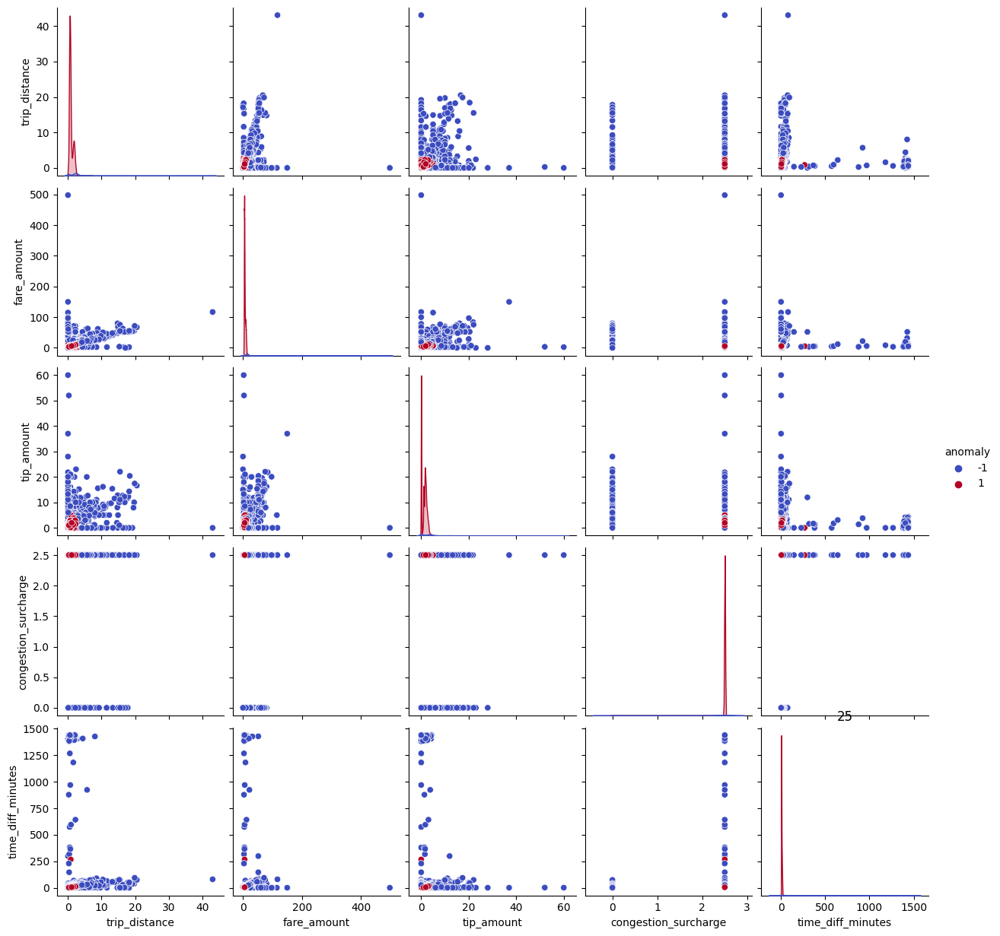

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


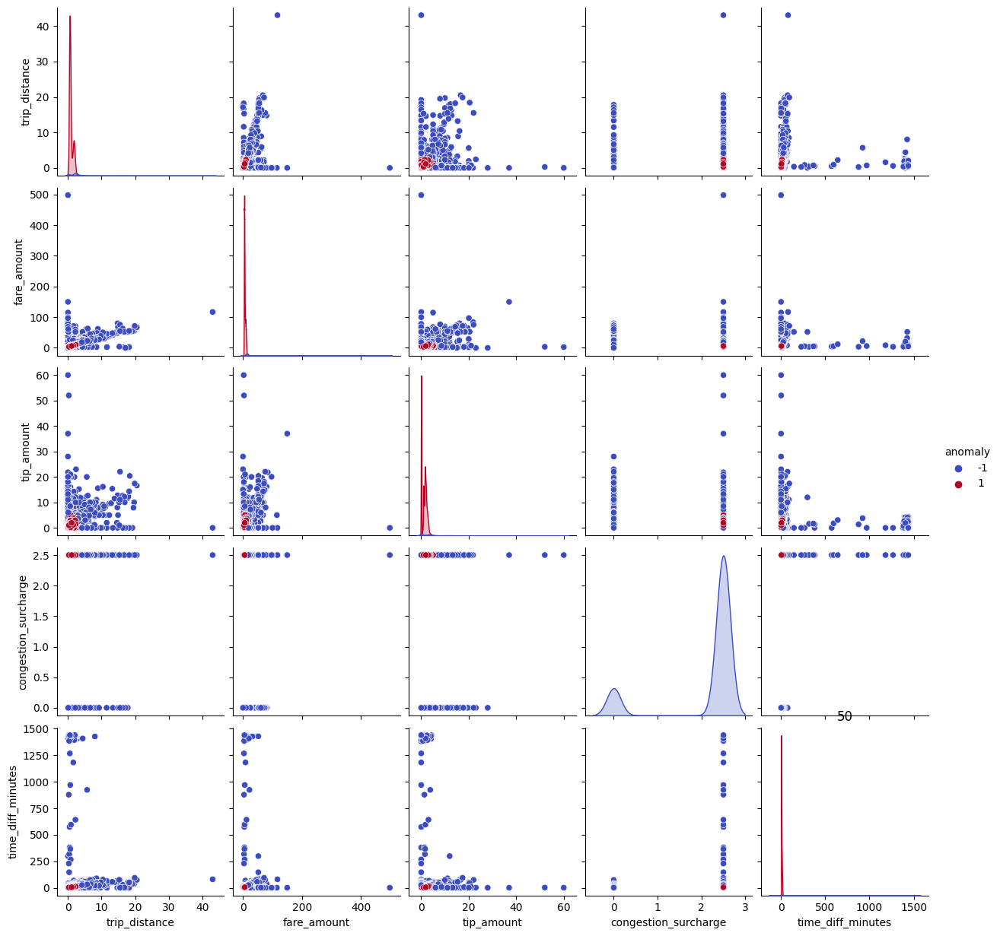

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


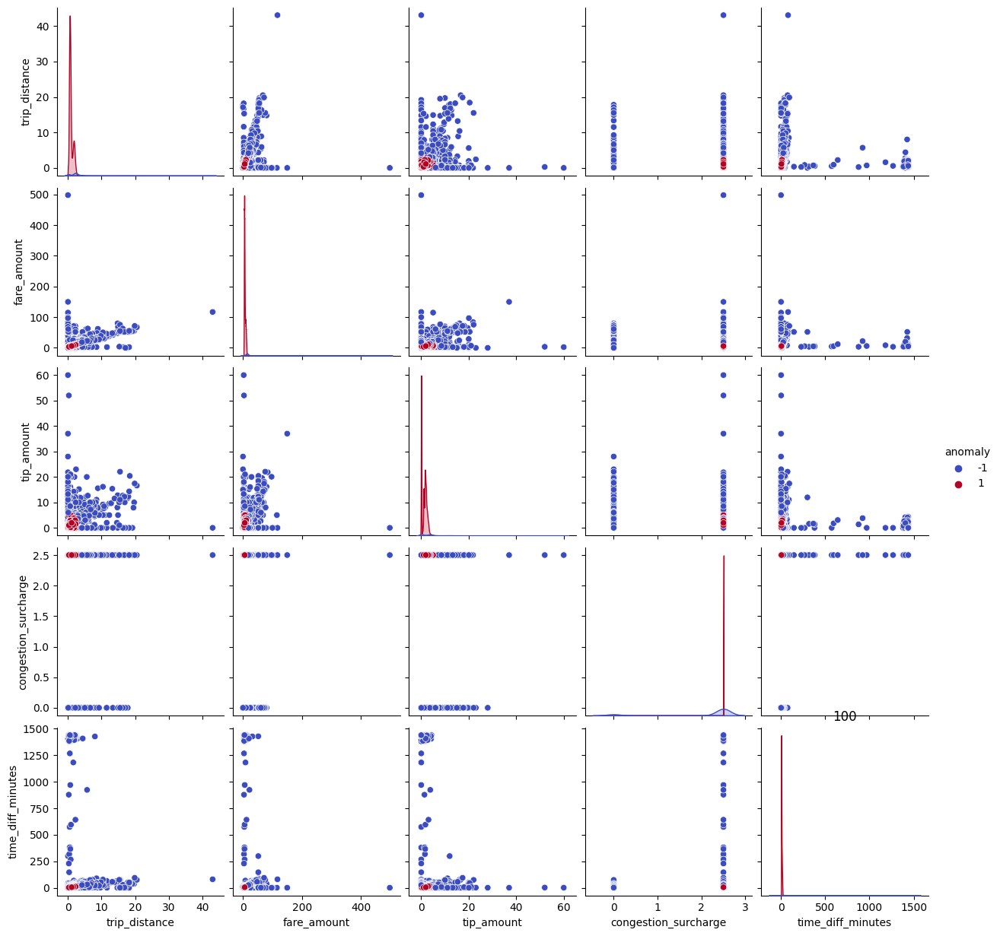

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


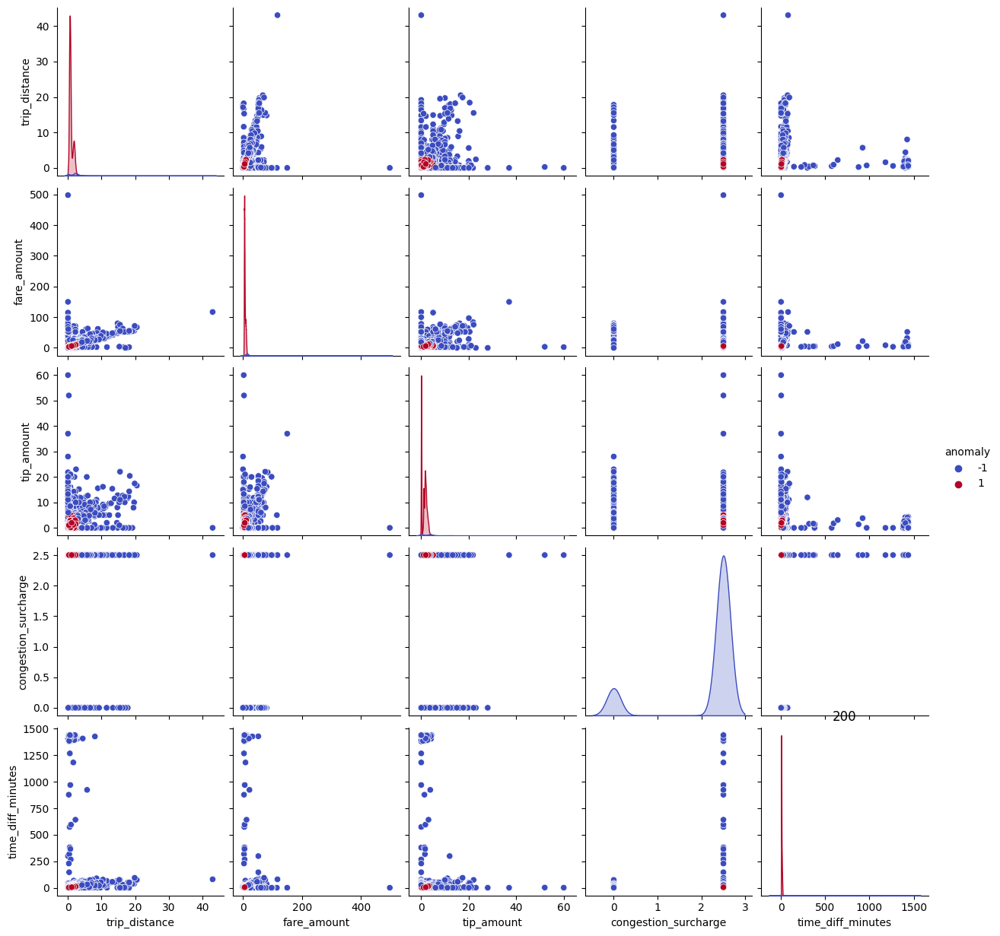

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


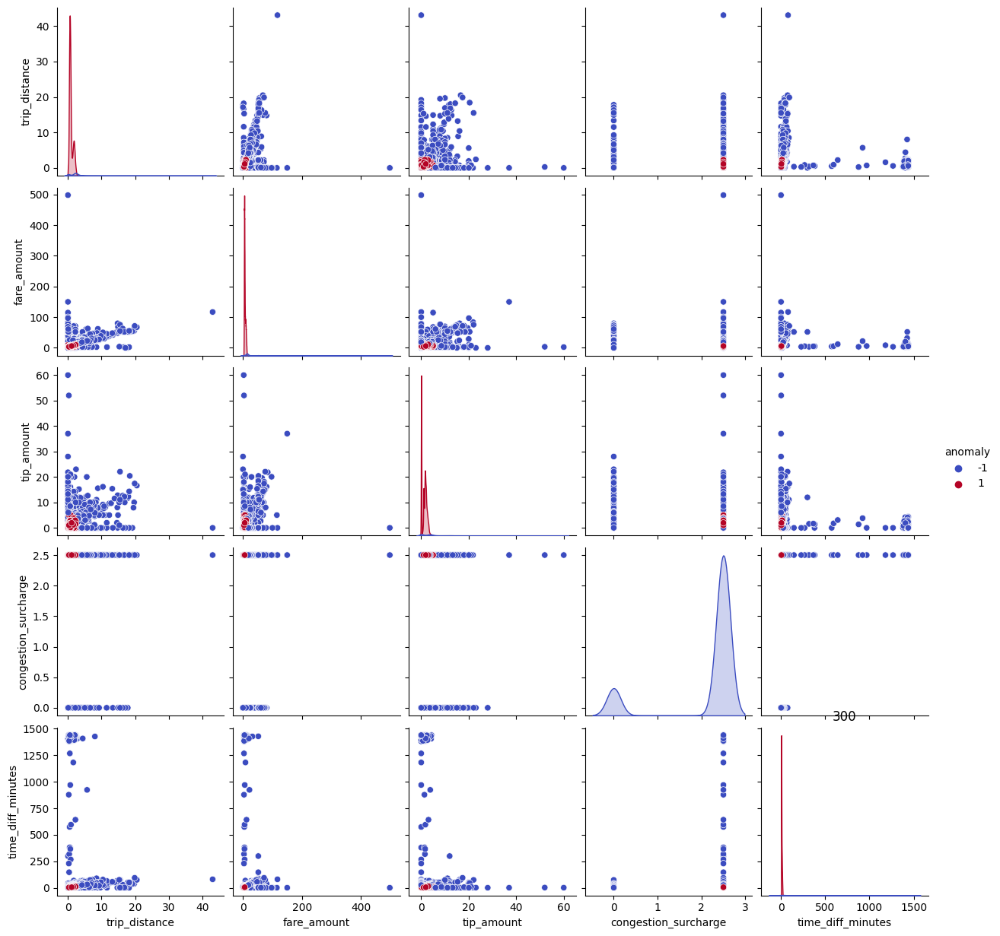

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1 ... -1  1  1]


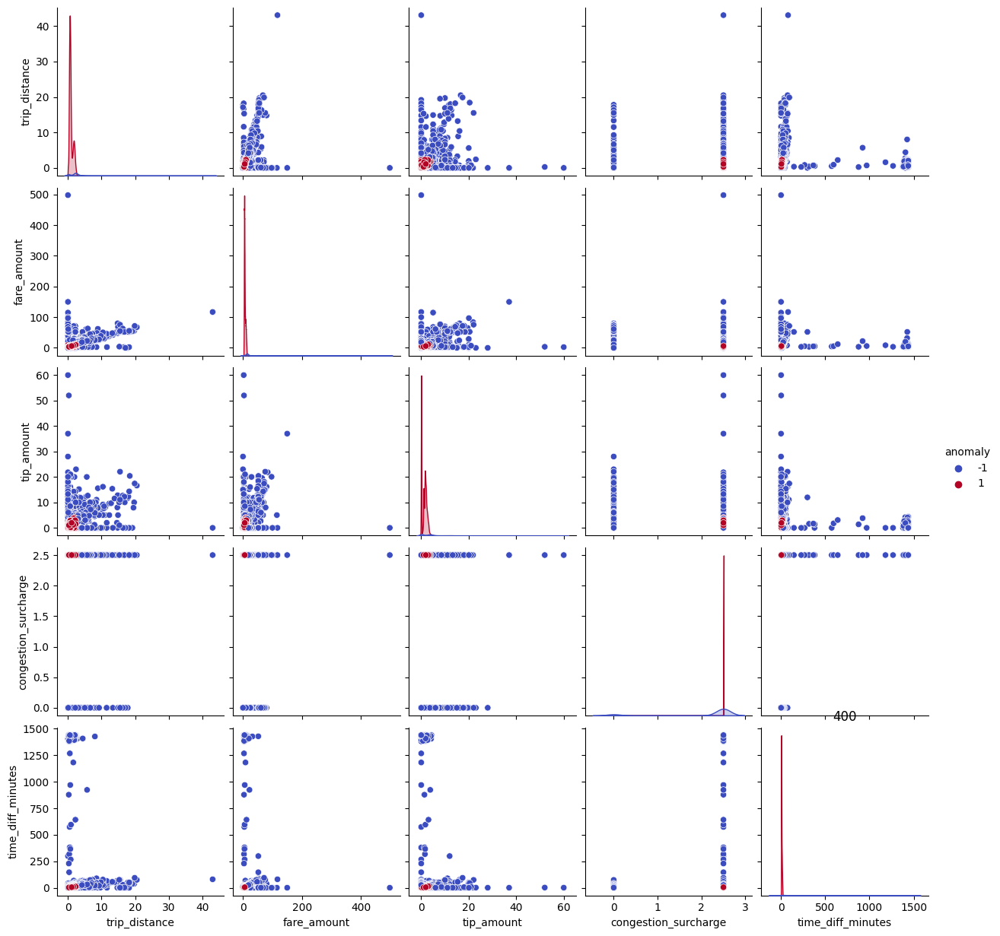

In [0]:
df_one_pd = df_one.toPandas()

for num in num_estimators:
    df_results = train_simple_iso_forest(num, df_one_pd.iloc[:100000], 0.05)
     # plot 2d result
    sns.pairplot(df_results, hue="anomaly", palette="coolwarm")
    plt.title(str(num))
    plt.show()


## Training small models

In [0]:

contamination = 0.025 # 5%
random_state = 42

num_estimators = 100

In [0]:
train_predict_times = []

df_dict = {
    "df_one": df_one,
    "df_two": df_two,
    "df_three": df_three,
    "df_four": df_four,
    "df_five": df_five
}

results_dict = {}


# Loop over the dictionary and access each DataFrame
for df_name, df in df_dict.items():

  df_train = df.toPandas()

  print(f"Count for {df_name}: {df_train.count()}")

  s_time = time.time()

  iso_forest = IsolationForest(n_estimators = num_estimators, contamination = contamination, random_state = random_state)

  iso_forest.fit(df_train)
  anomalies = iso_forest.predict(df_train)

  results = df_train.copy()
  results["outliers"] = anomalies

  results_dict[df_name + "_results"] = results

  e_time = time.time()
  print(f"Time: {e_time - s_time}")
  train_predict_times.append(e_time - s_time)

Count for df_one: trip_distance           200000
fare_amount             200000
tip_amount              200000
congestion_surcharge    200000
time_diff_minutes       200000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 14.397870302200317
Count for df_two: trip_distance           200000
fare_amount             200000
tip_amount              200000
congestion_surcharge    200000
time_diff_minutes       200000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 13.296045780181885
Count for df_three: trip_distance           200000
fare_amount             200000
tip_amount              200000
congestion_surcharge    200000
time_diff_minutes       200000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 13.253854036331177
Count for df_four: trip_distance           200000
fare_amount             200000
tip_amount              200000
congestion_surcharge    200000
time_diff_minutes       200000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 13.386023998260498
Count for df_five: trip_distance           200000
fare_amount             200000
tip_amount              200000
congestion_surcharge    200000
time_diff_minutes       200000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 13.399794816970825


In [0]:
import pandas as pd

dfs_list = []

for df_result, df in results_dict.items():
    dfs_list.append(df)

results_five = pd.concat(dfs_list, ignore_index=True)

print(results_five)
print(f"Count for combined df: {len(results_five)}")

        trip_distance  fare_amount  ...  time_diff_minutes  outliers
0                0.41          4.0  ...              3.100         1
1                1.11          6.5  ...              6.550         1
2                0.90          4.5  ...              5.283         1
3                0.00          3.0  ...              1.250         1
4                0.98          6.0  ...              6.417         1
...               ...          ...  ...                ...       ...
999995           0.50          4.0  ...              2.067         1
999996           0.95          5.5  ...              5.083         1
999997           0.87          5.5  ...             15.700         1
999998           0.79          5.5  ...              4.867         1
999999           0.35          3.0  ...              1.167         1

[1000000 rows x 6 columns]
Count for combined df: 1000000


## Training all_df

In [0]:
df = df_all
df_train = df.toPandas()

print(f"Count for {df_name}: {df_train.count()}")

s_time = time.time()

iso_forest = IsolationForest(n_estimators = num_estimators, contamination = contamination, random_state = random_state)

iso_forest.fit(df_train)
anomalies = iso_forest.predict(df_train)

results_all = df_train.copy()
results_all["outliers"] = anomalies

e_time = time.time()
print(f"Time: {e_time - s_time}")

Count for df_five: trip_distance           1000000
fare_amount             1000000
tip_amount              1000000
congestion_surcharge    1000000
time_diff_minutes       1000000
dtype: int64


/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Time: 62.97576689720154


## Comparison

In [0]:
# The df's are not sorted so doing that first.

input_columns = ['trip_distance', 'fare_amount', 'tip_amount', 'congestion_surcharge', 'time_diff_minutes']

results_all['key'] = results_all[input_columns].apply(tuple, axis=1)
results_five['key'] = results_five[input_columns].apply(tuple, axis=1)

print(set(results_all['key']) - set(results_five['key']))  # Rows in results_all not in results_five
print(set(results_five['key']) - set(results_all['key']))  

results_all = results_all.sort_values(by='key').reset_index(drop=True)
results_five = results_five.sort_values(by='key').reset_index(drop=True)

# Drop the key column as it's no longer needed
results_all = results_all.drop(columns=['key'])
results_five = results_five.drop(columns=['key'])

# Display the sorted DataFrames
print("Sorted results_all:\n", results_all.head())
print("Sorted results_five:\n", results_five.head())

set()
set()
Sorted results_all:
    trip_distance  fare_amount  ...  time_diff_minutes  outliers
0            0.0          0.0  ...              0.033         1
1            0.0          0.0  ...              0.050         1
2            0.0          0.0  ...              0.050         1
3            0.0          0.0  ...              0.067         1
4            0.0          0.0  ...              0.067         1

[5 rows x 6 columns]
Sorted results_five:
    trip_distance  fare_amount  ...  time_diff_minutes  outliers
0            0.0          0.0  ...              0.033         1
1            0.0          0.0  ...              0.050         1
2            0.0          0.0  ...              0.050         1
3            0.0          0.0  ...              0.067         1
4            0.0          0.0  ...              0.067         1

[5 rows x 6 columns]


In [0]:
unequal_count = (results_all['outliers'] != results_five['outliers']).sum()

print(f"Number of unequal predictions {unequal_count}, out of a total of {len(results_all)} predictions. Percentage = {unequal_count / len(results_all) *100:,.2f}%")

unequal_rows = results_all[results_all['outliers'] != results_five['outliers']]

pd.set_option('display.max_columns', None)

print(unequal_rows.head(10))

Number of unequal predictions 10017, out of a total of 1000000 predictions. Percentage = 1.00%
     trip_distance  fare_amount  tip_amount  congestion_surcharge  \
176            0.0         0.00         0.0                   0.0   
212            0.0         0.00         7.0                   2.5   
213            0.0         0.00         8.0                   0.0   
216            0.0         0.00        10.0                   0.0   
480            0.0         0.01         0.0                   0.0   
484            0.0         0.01         0.0                   0.0   
492            0.0         0.01         0.0                   0.0   
518            0.0         0.01         6.0                   0.0   
519            0.0         0.01         6.5                   0.0   
521            0.0         0.01        10.0                   0.0   

     time_diff_minutes  outliers  
176             25.083         1  
212              0.150         1  
213              0.717        -1  
216  

Do the pairplot with random subsets of the data. Takes 20+ minutes without



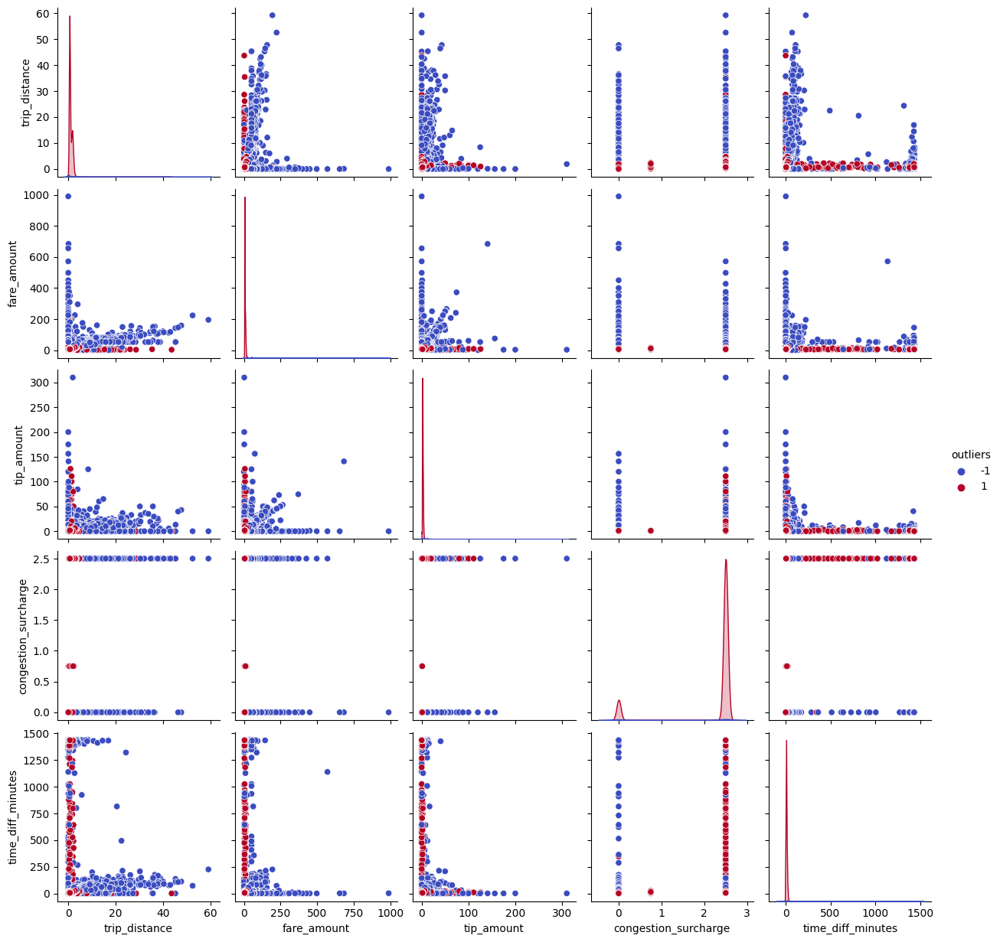

In [0]:
sns.pairplot(results_all, hue="outliers", palette="coolwarm")
plt.show()

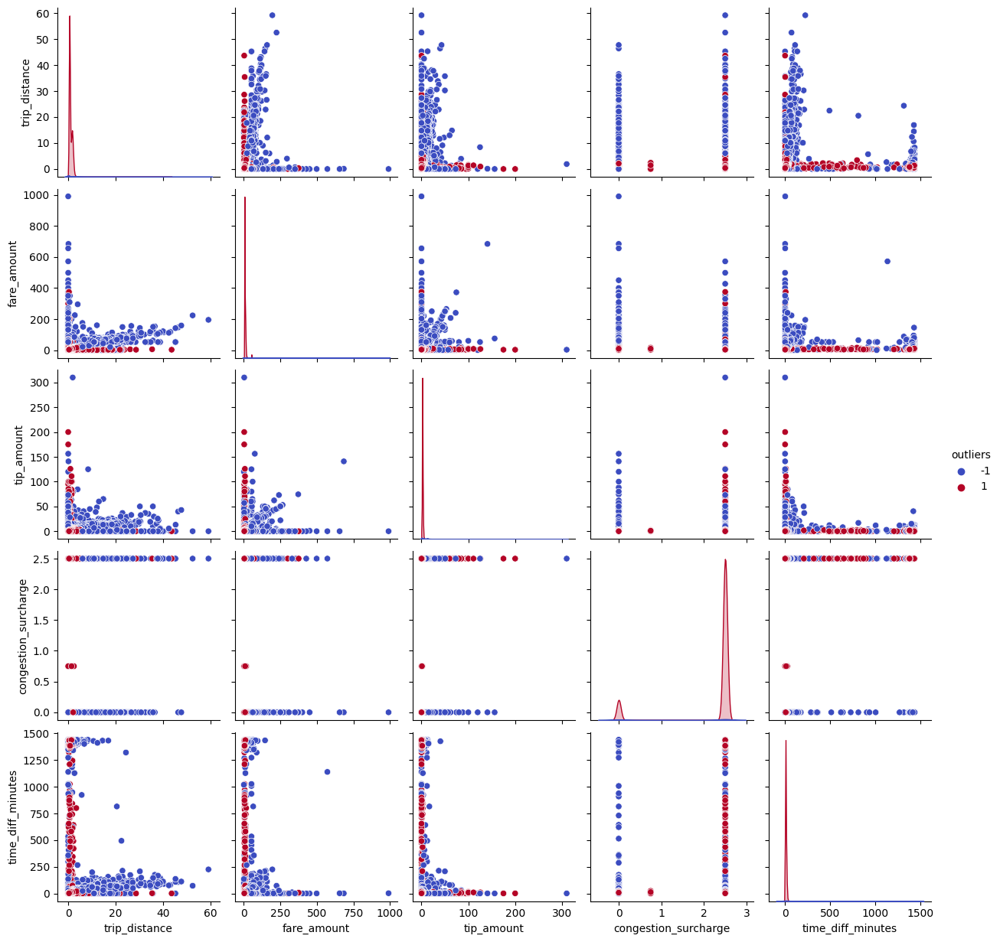

In [0]:
sns.pairplot(results_five, hue="outliers", palette="coolwarm")
plt.show()

In [0]:
import time
time.sleep(500000)